In [1]:
!pip install matplotlib
!pip install opencv-python

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [3]:
plt.rcParams['figure.figsize'] = [20, 20]

# 圖片加載、顯示和保存

In [4]:
# 讀取
img = cv2.imread('./data/fruits.jpg')

# 圖片的常用屬性的獲取

In [5]:
# 儲存數值型態
img.dtype

dtype('uint8')

In [6]:
# 像素
img.size

737280

In [7]:
# 尺寸
img.shape

(480, 512, 3)

In [8]:
480*512*3

737280

In [9]:
img

array([[[ 13,  62, 130],
        [ 14,  63, 131],
        [ 15,  64, 134],
        ...,
        [ 77,  73,  68],
        [ 72,  70,  69],
        [ 67,  67,  67]],

       [[ 18,  67, 137],
        [ 18,  67, 137],
        [ 17,  65, 137],
        ...,
        [ 60,  58,  57],
        [ 66,  62,  61],
        [ 70,  66,  65]],

       [[ 18,  65, 139],
        [ 17,  64, 138],
        [ 15,  61, 138],
        ...,
        [ 42,  38,  43],
        [ 53,  51,  50],
        [ 68,  65,  60]],

       ...,

       [[ 56, 112, 101],
        [ 58, 114, 103],
        [ 63, 116, 106],
        ...,
        [ 16,  35,  48],
        [ 17,  36,  49],
        [ 17,  36,  49]],

       [[ 52, 108,  97],
        [ 56, 109,  99],
        [ 58, 111, 101],
        ...,
        [ 16,  37,  52],
        [ 15,  36,  51],
        [ 17,  38,  53]],

       [[ 51, 107,  96],
        [ 52, 105,  95],
        [ 55, 107,  97],
        ...,
        [ 15,  38,  53],
        [ 14,  37,  52],
        [ 17,  40,  55]]

In [10]:
# 儲存
cv2.imwrite('./data/fruits_copy.jpg', img)

True

# 彩色空間轉換

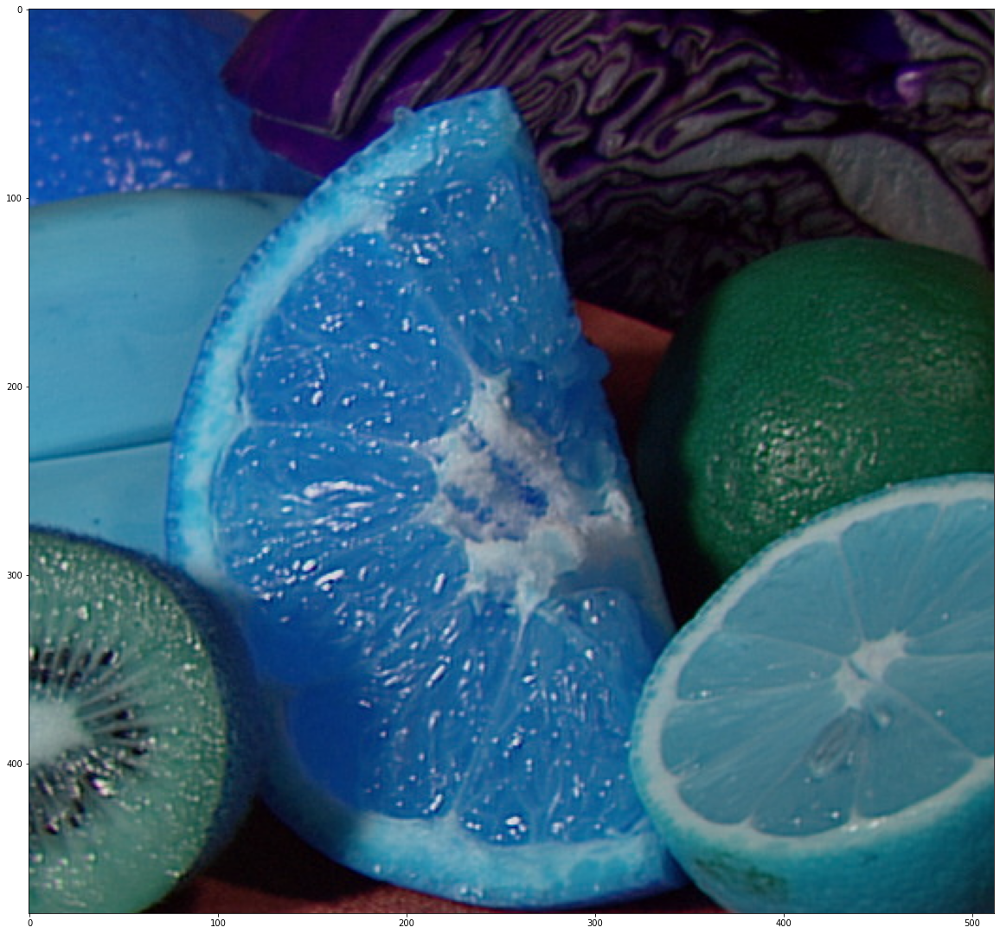

In [11]:
plt.imshow(img)

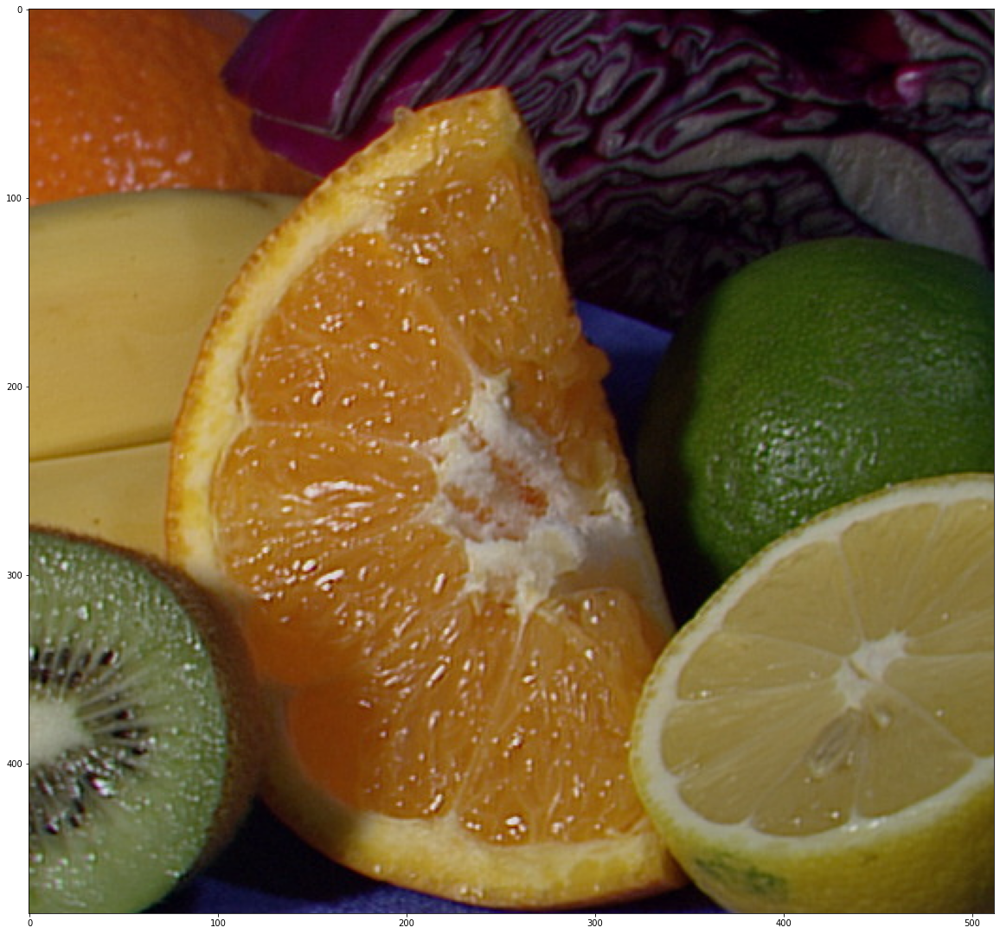

In [12]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [13]:
# 儲存
cv2.imwrite('./data/fruits_cvt.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

True

# ROI

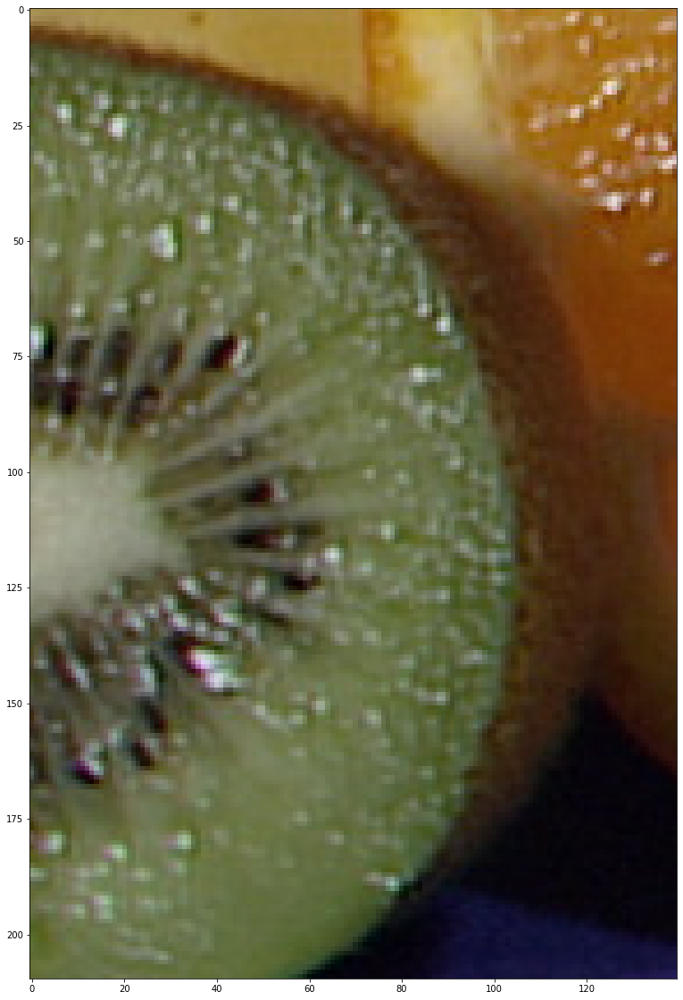

In [14]:
roi =  img[270:,:140]
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

# RGB通道的分離與合併

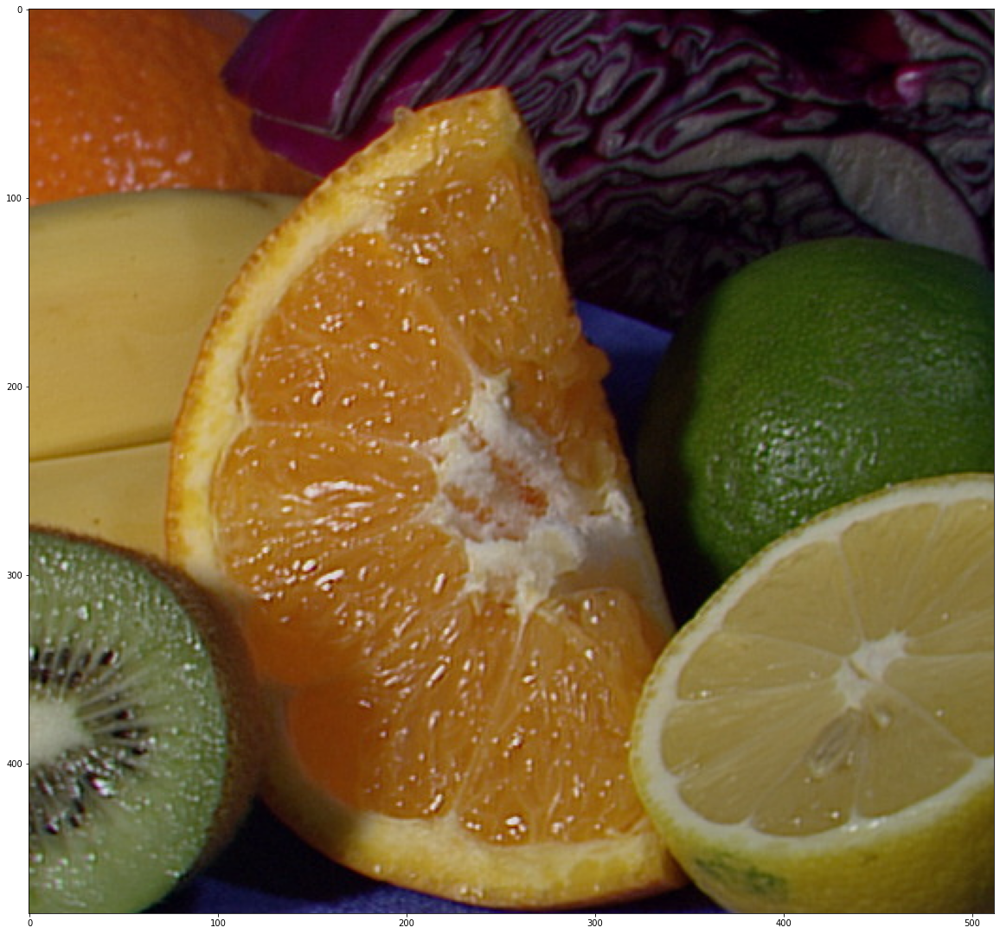

In [15]:
b,g,r = cv2.split(img)
merge = cv2.merge([r,g,b])
plt.imshow(merge)

# 圖片相加

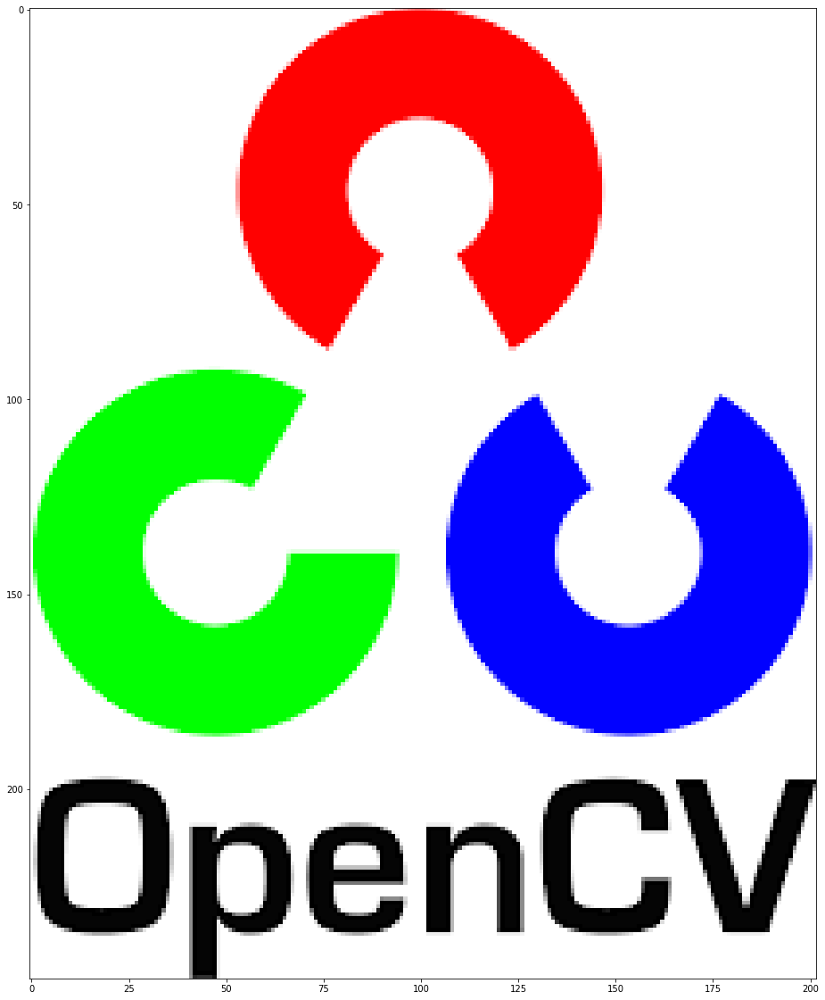

In [16]:
img2 = cv2.imread('./data/opencv_logo.png',1)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

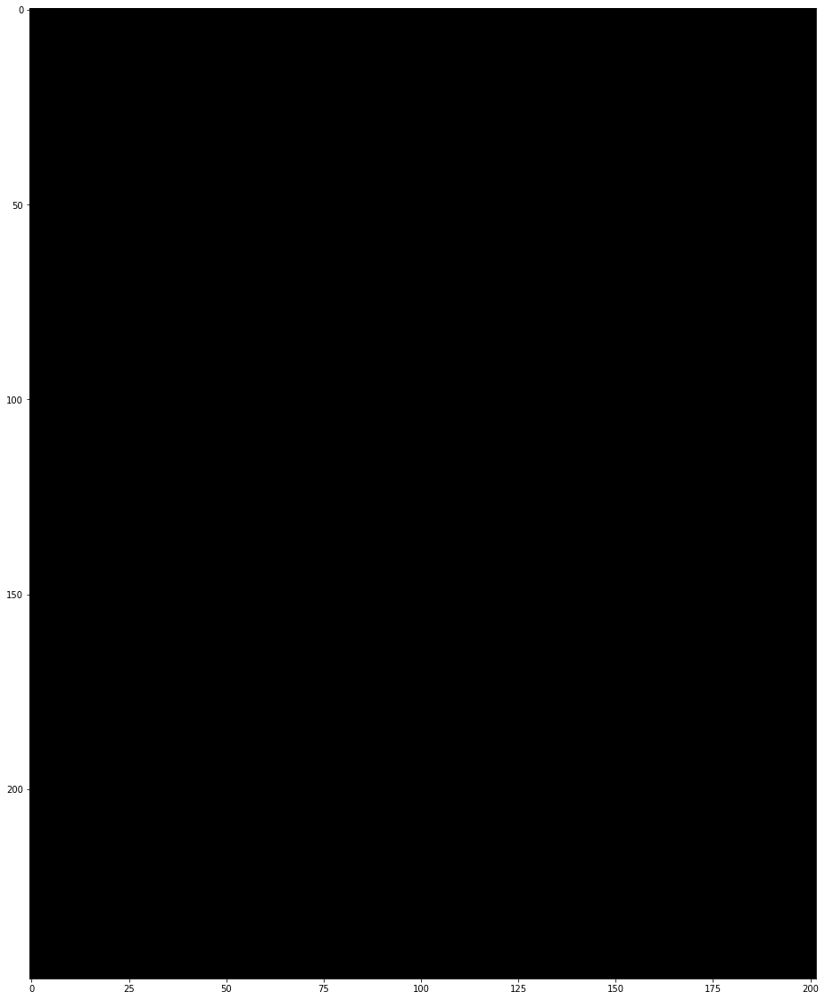

In [17]:
img1 = np.zeros(img2.shape)
plt.imshow(img1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


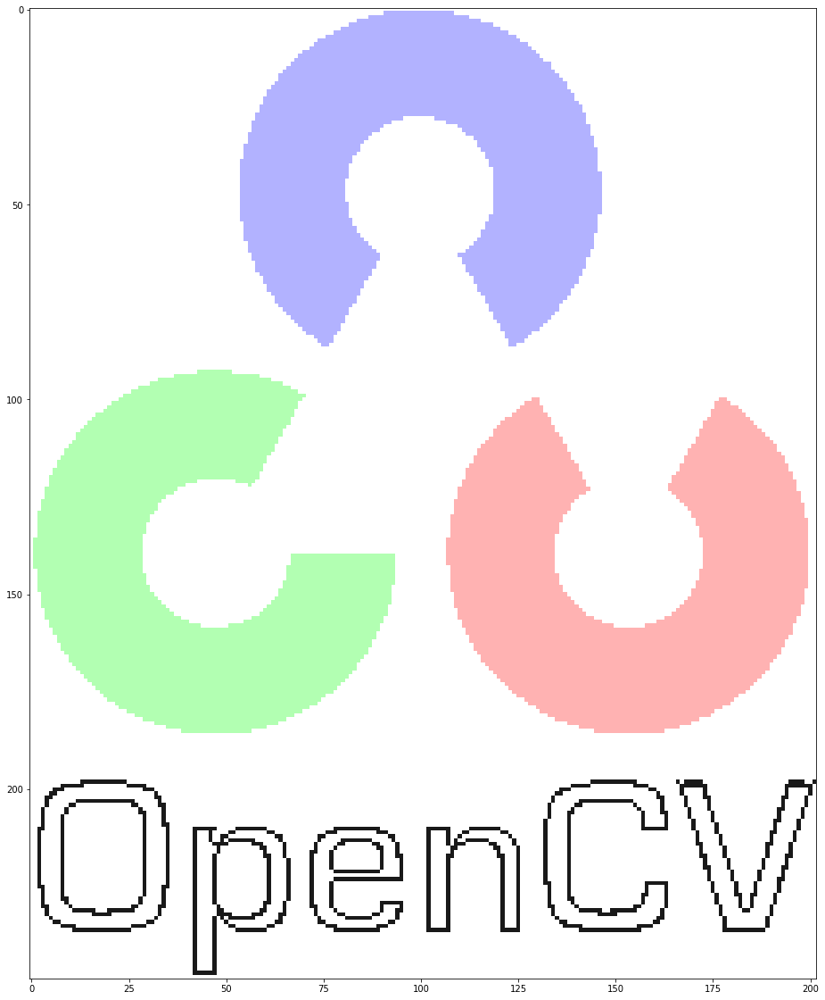

In [18]:
img2 = img2.astype(float)
dst = cv2.addWeighted(img1,0.3,img2,0.6,0.1)
plt.imshow(dst)

# 二值化

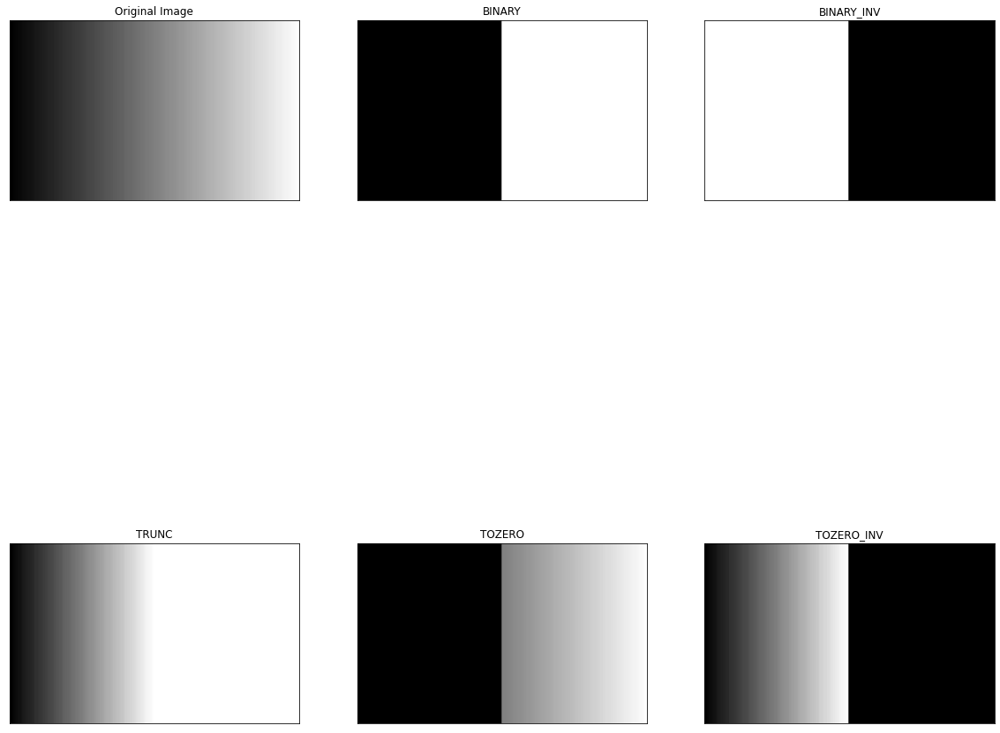

In [19]:
img = cv2.imread('./data/gradient.png',0)
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

# 適應性二值化

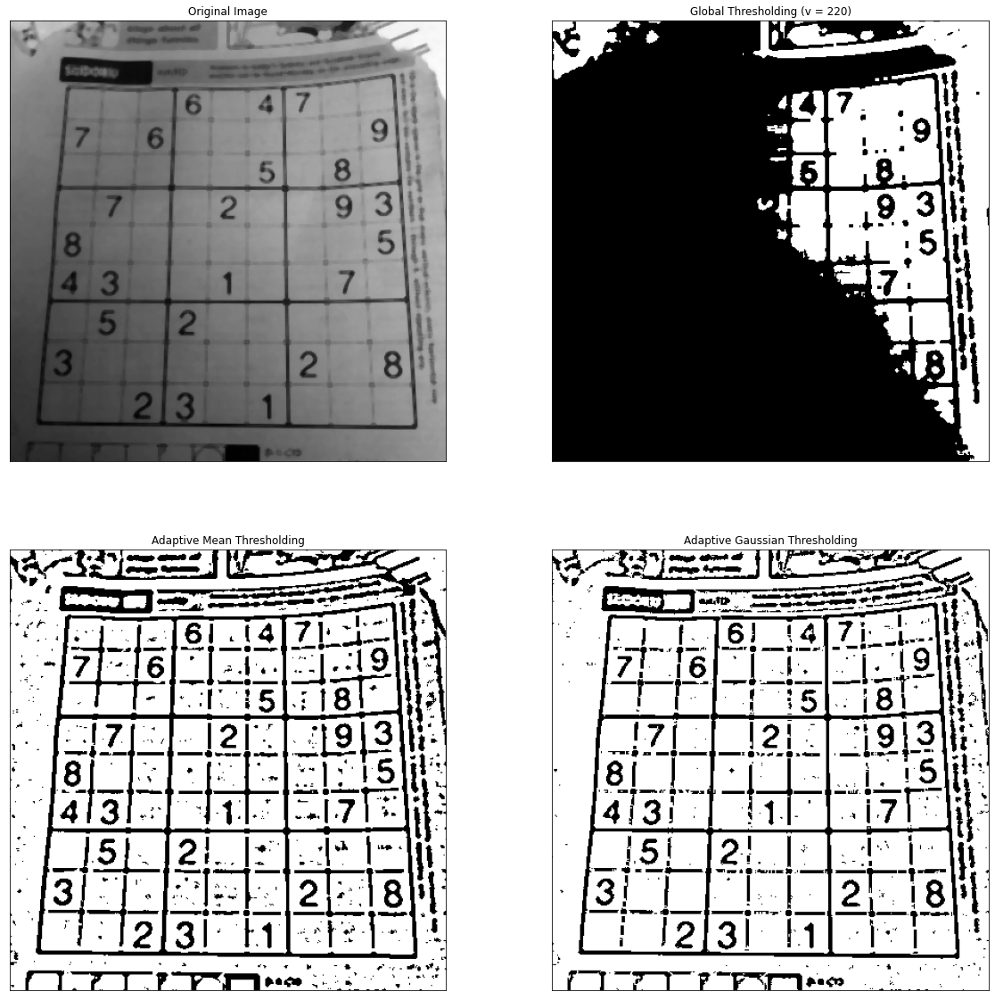

In [20]:
img = cv2.imread('./data/dave.jpg',0)
img = cv2.medianBlur(img,5)

ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 220)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

# 像素邏輯運算

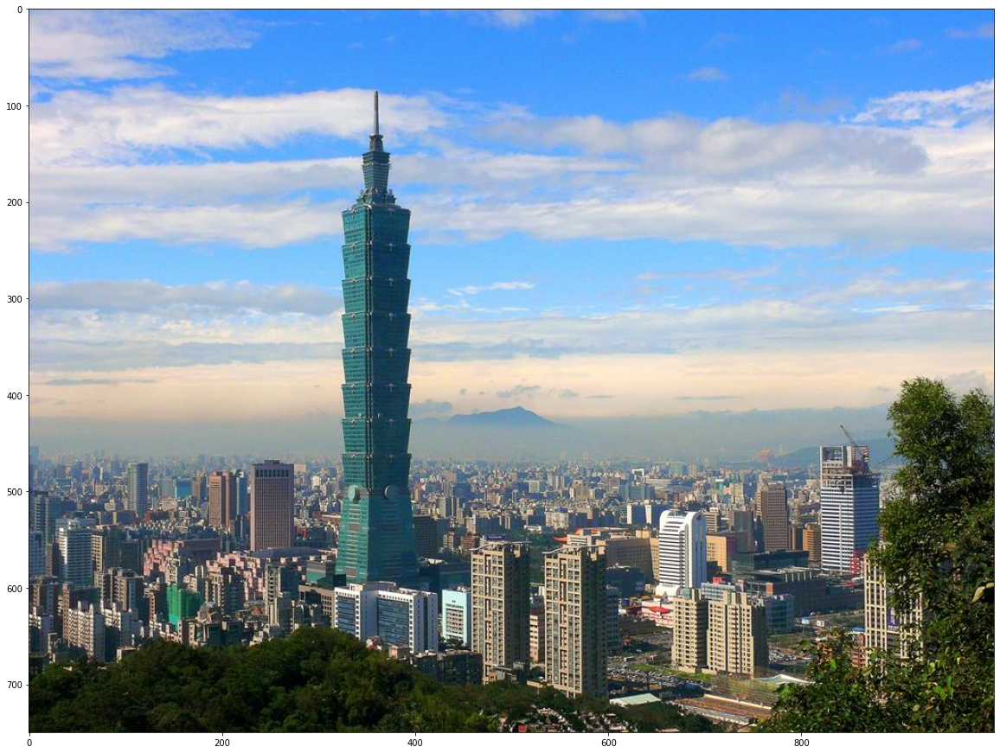

In [21]:
img1 = cv2.imread('./data/101.JPG')
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))

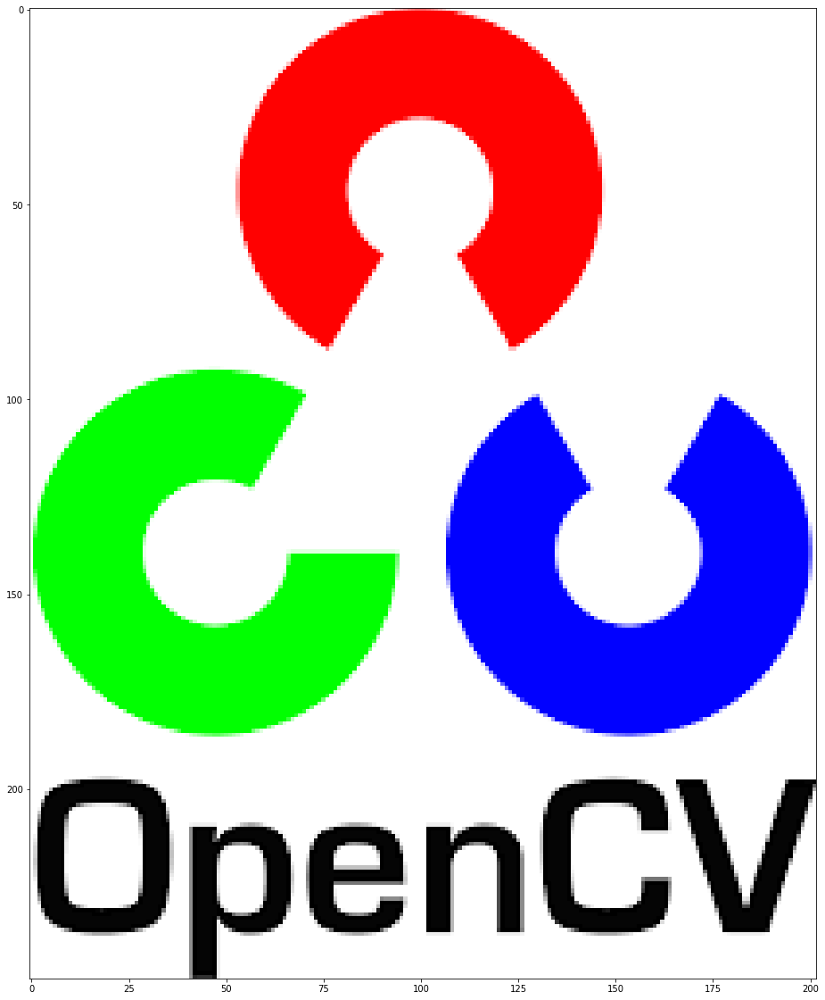

In [22]:
img2 = cv2.imread('./data/opencv_logo.png')
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

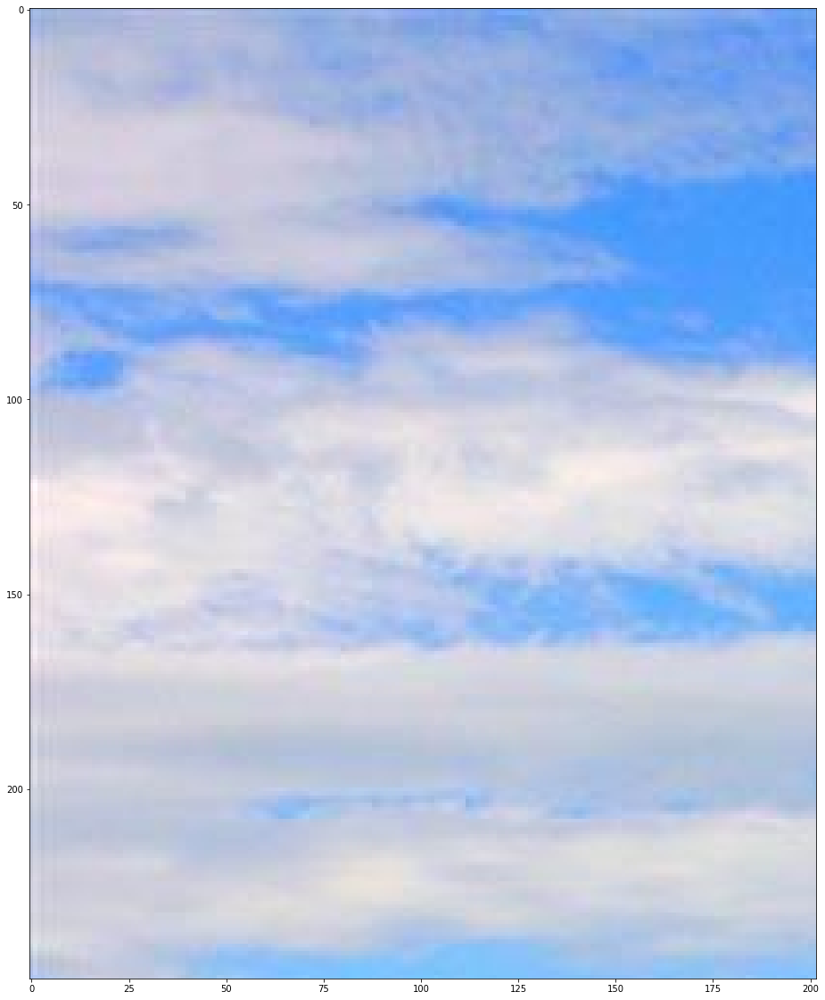

In [23]:
# I want to put logo on top-left corner, So I create a ROI
rows,cols,channels = img2.shape
roi = img1[0:rows, 0:cols ]
plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))

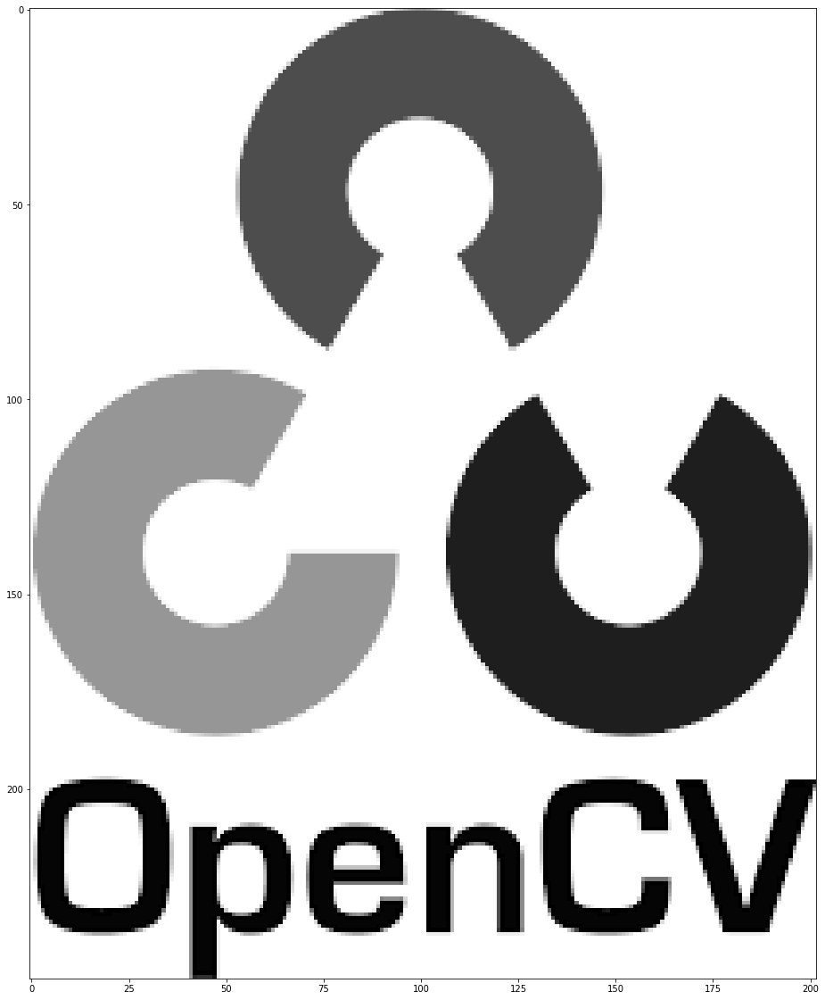

In [24]:
# Now create a mask of logo and create its inverse mask also
img2gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(img2gray, cv2.COLOR_BGR2RGB))

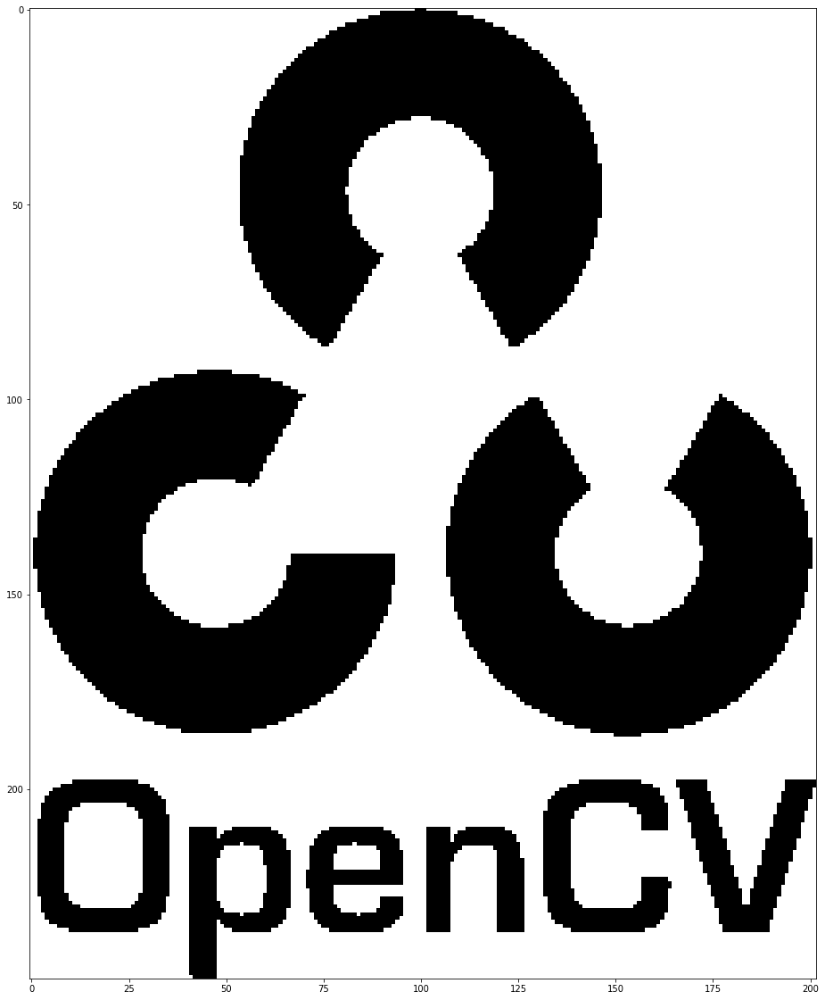

In [25]:
ret, mask = cv2.threshold(img2gray, 150, 255, cv2.THRESH_BINARY)
plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))

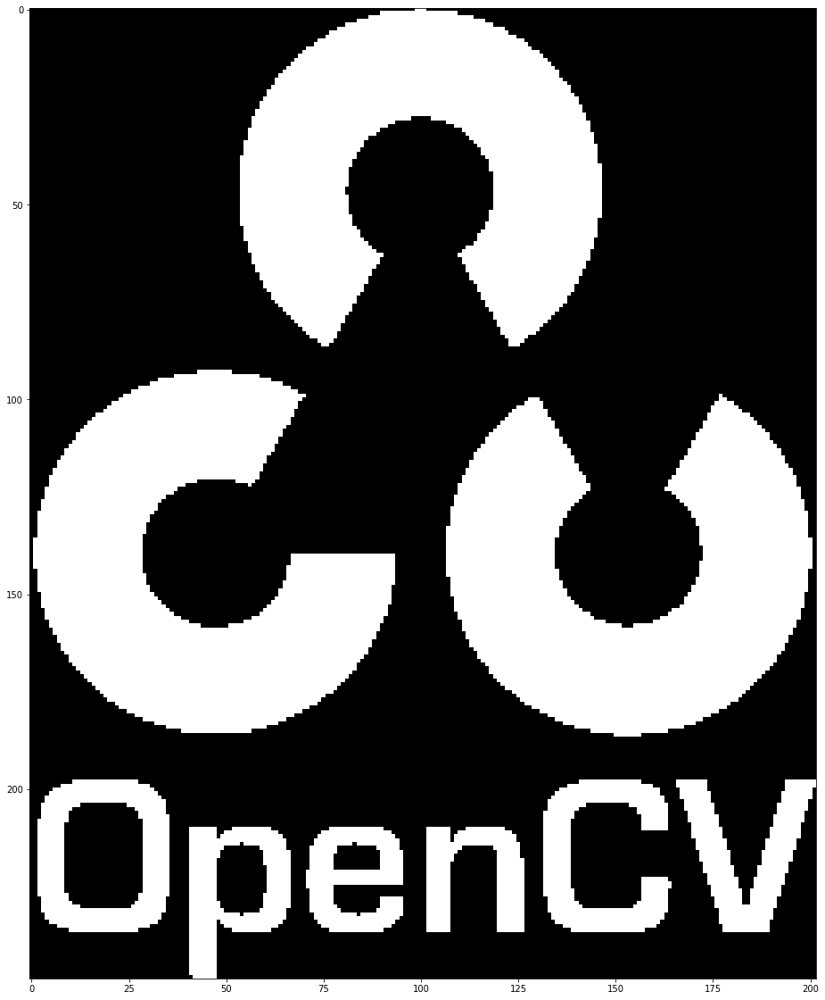

In [26]:
mask_inv = cv2.bitwise_not(mask)
plt.imshow(cv2.cvtColor(mask_inv, cv2.COLOR_BGR2RGB))

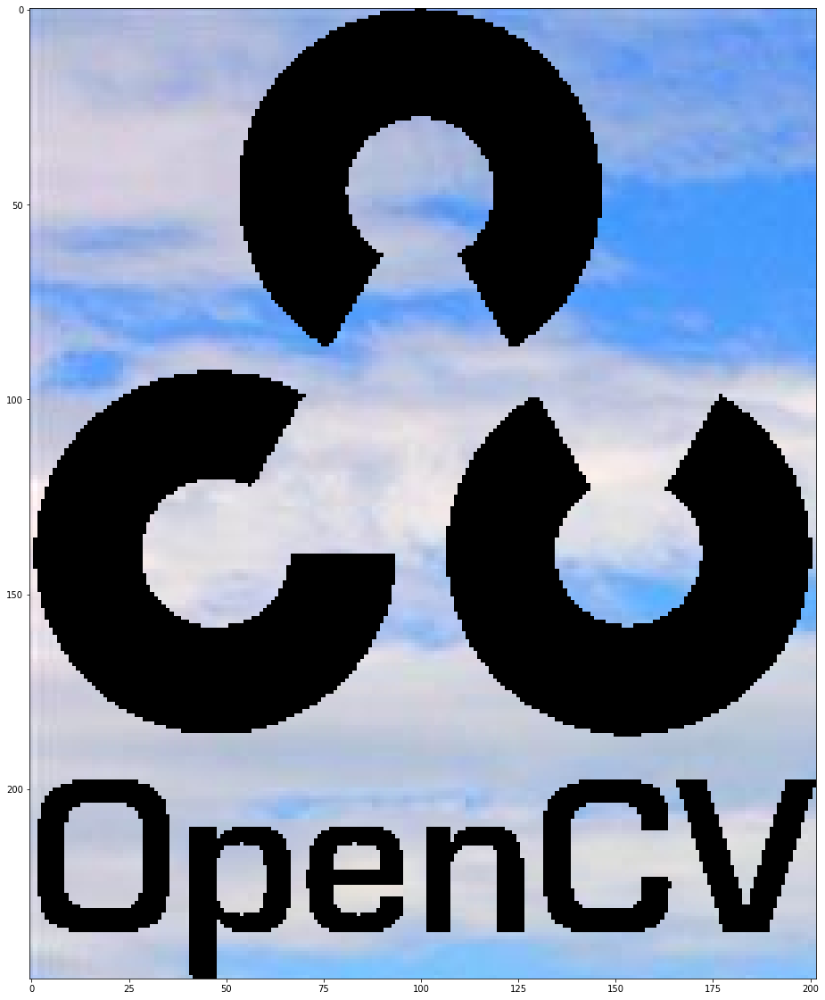

In [27]:
# Now black-out the area of logo in ROI
img1_bg = cv2.bitwise_and(roi,roi,mask = mask)
plt.imshow(cv2.cvtColor(img1_bg, cv2.COLOR_BGR2RGB))

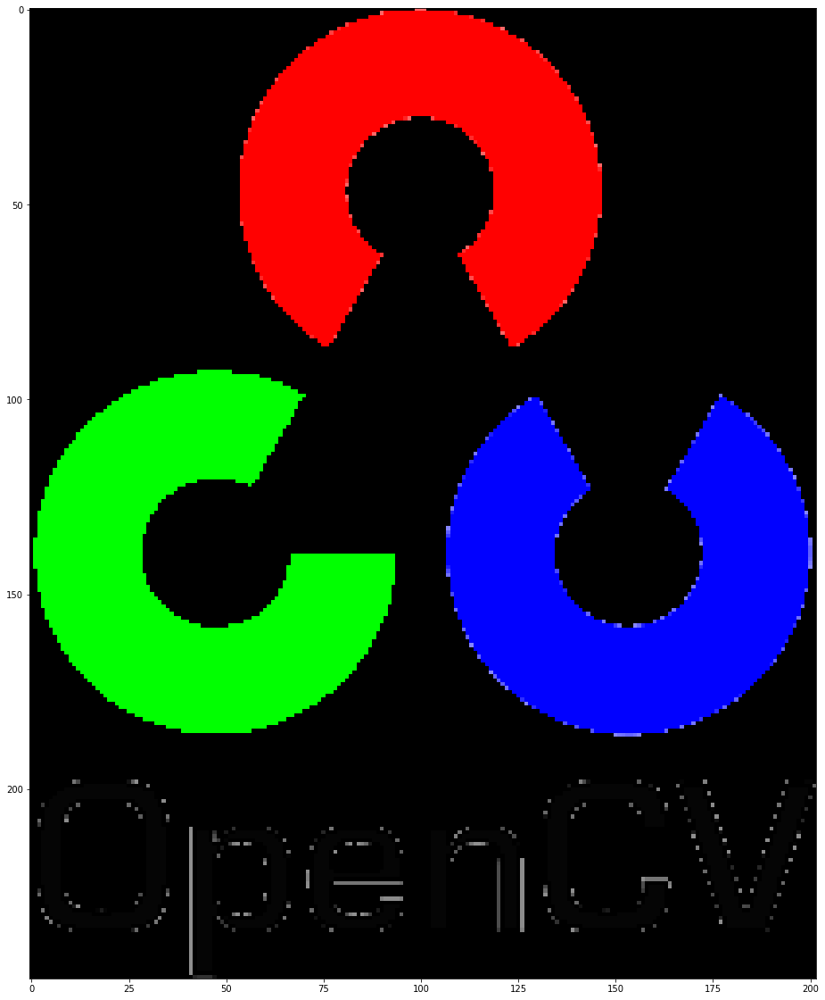

In [28]:
# Take only region of logo from logo image.
img2_fg = cv2.bitwise_and(img2,img2,mask = mask_inv)
plt.imshow(cv2.cvtColor(img2_fg, cv2.COLOR_BGR2RGB))

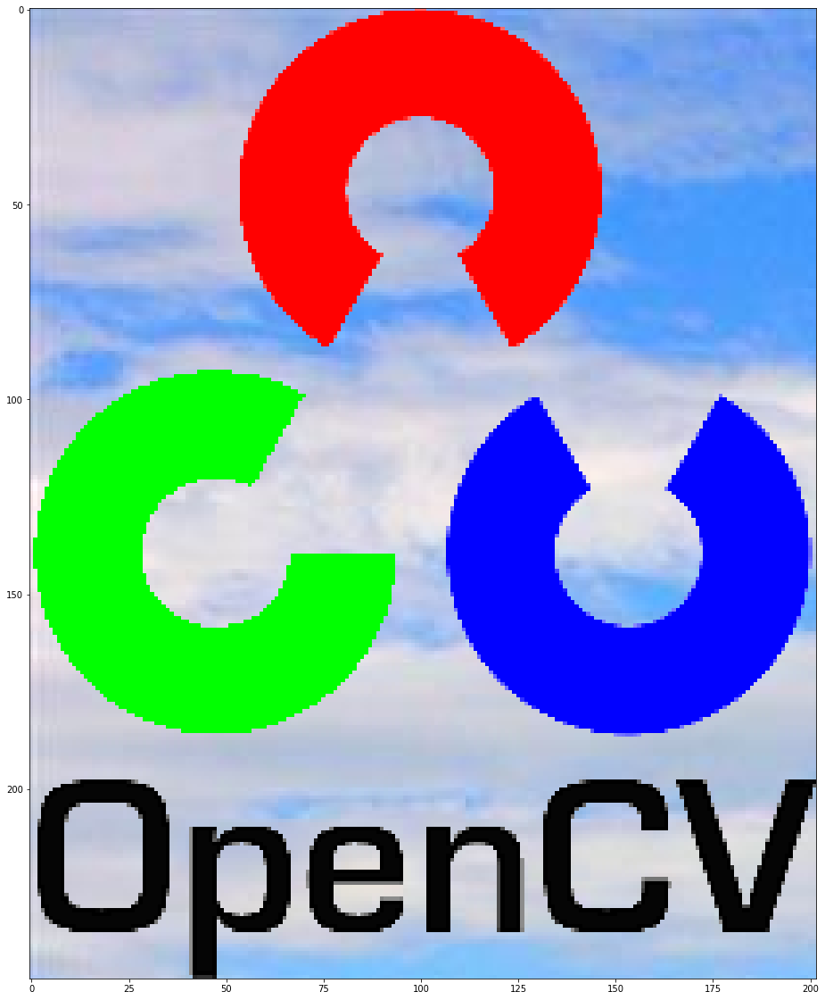

In [29]:
# Put logo in ROI and modify the main image
dst = cv2.add(img1_bg,img2_fg)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

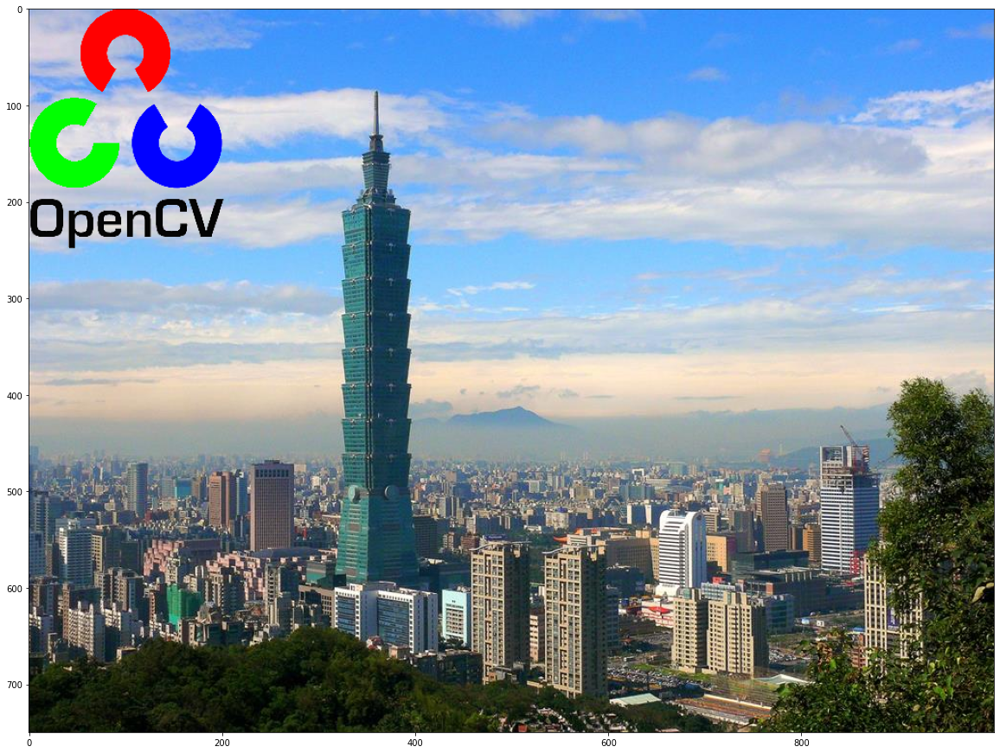

In [30]:
img1[0:rows, 0:cols ] = dst
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))

# 2D 捲積

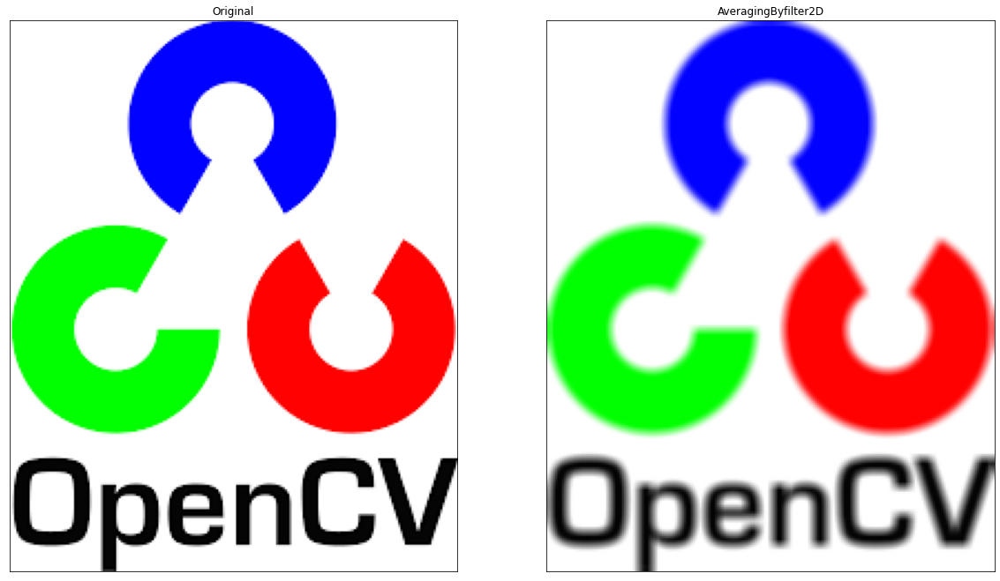

In [31]:
img = cv2.imread('./data/opencv_logo.png')
kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(img,-1,kernel)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('AveragingByfilter2D')
plt.xticks([]), plt.yticks([])
plt.show()

# 圖像梯度

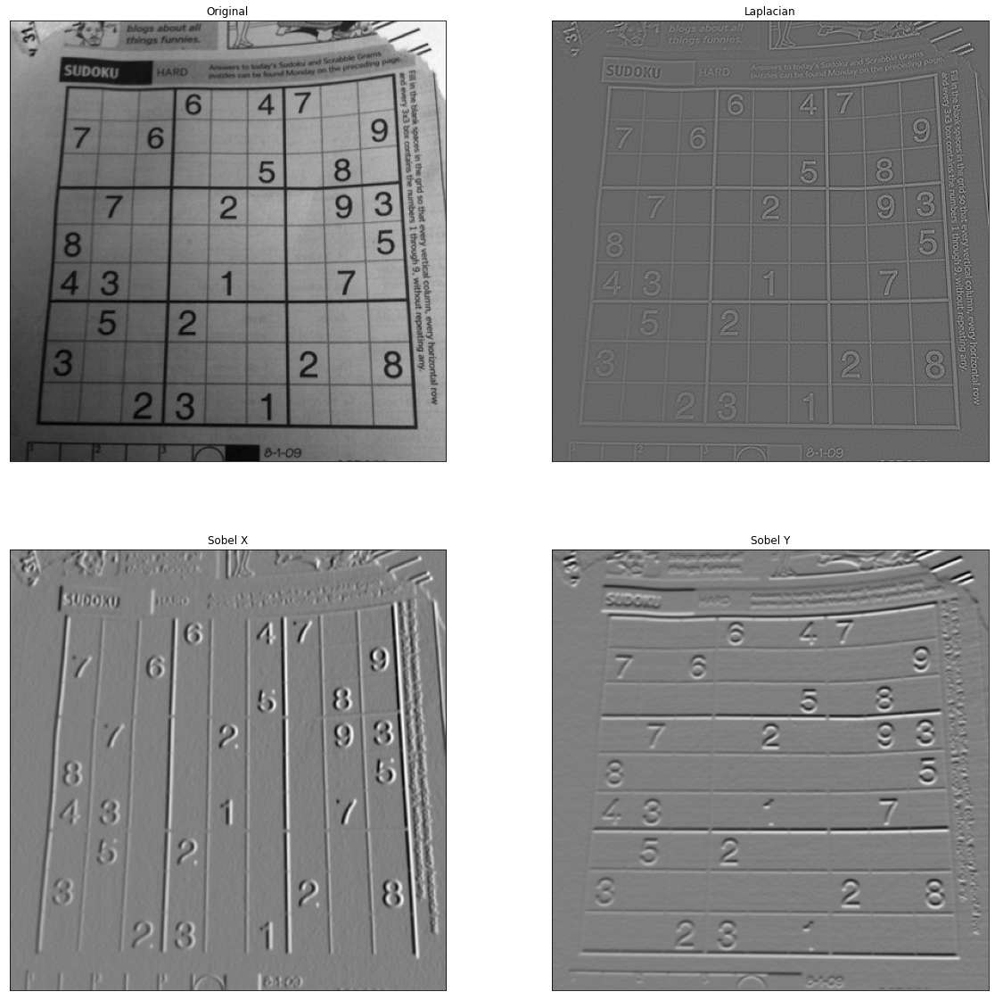

In [32]:
img = cv2.imread('./data/dave.jpg',0)

laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

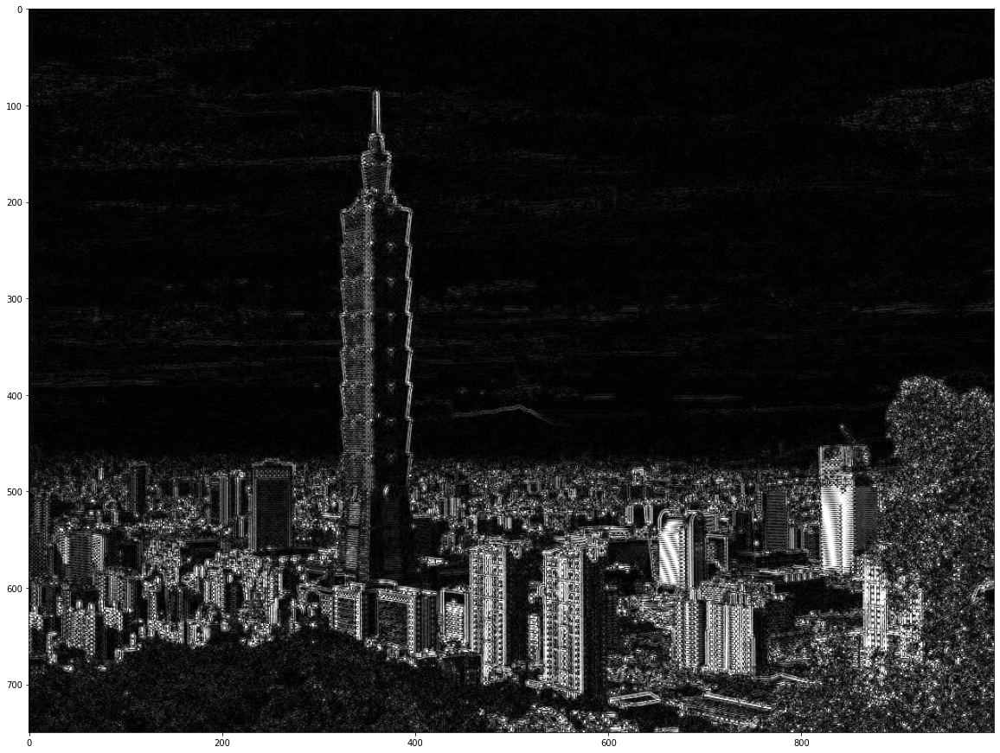

In [33]:
# laplacian
kernel_size = 3
scale = 1
delta = 0
ddepth = cv2.CV_16S

img = cv2.imread('./data/101.JPG')
img = cv2.GaussianBlur(img, (3, 3), 0)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

gray_lap = cv2.Laplacian(gray, ddepth, ksize=kernel_size, scale=scale, delta=delta)
dst = cv2.convertScaleAbs(gray_lap)

plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

# 形態學轉換

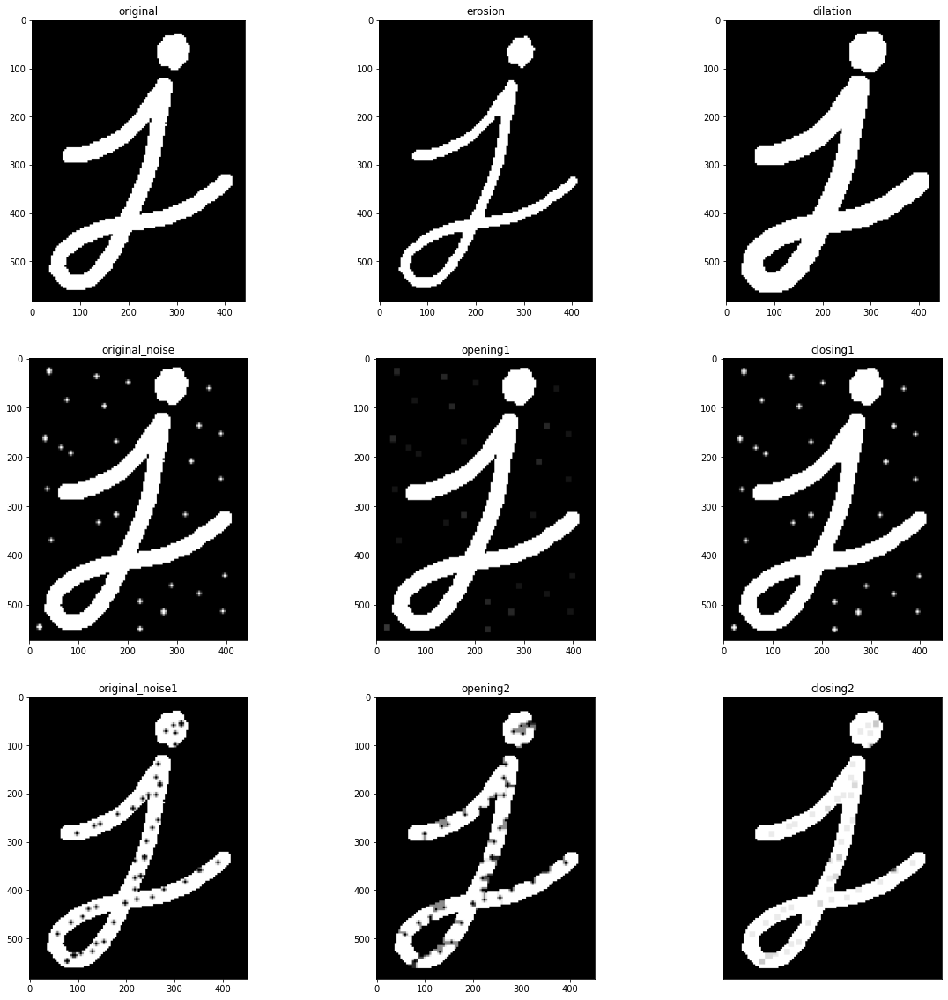

In [34]:
img = cv2.imread('./data/j.png',1)
img1 = cv2.imread('./data/j_noise.png',1)
img2 = cv2.imread('./data/j_noise1.png',1)
kernel = np.ones((10,10),np.uint8)
erosion = cv2.erode(img,kernel,iterations = 1)
dilation = cv2.dilate(img,kernel,iterations = 1)

opening1 = cv2.morphologyEx(img1, cv2.MORPH_OPEN, kernel)
closing1 = cv2.morphologyEx(img1, cv2.MORPH_CLOSE, kernel)
opening2 = cv2.morphologyEx(img2, cv2.MORPH_OPEN, kernel)
closing2 = cv2.morphologyEx(img2, cv2.MORPH_CLOSE, kernel)
plt.subplot(332),plt.imshow(erosion),plt.title('erosion')
plt.subplot(331),plt.imshow(img),plt.title('original')
plt.subplot(333),plt.imshow(dilation),plt.title('dilation')
plt.subplot(334),plt.imshow(img1),plt.title('original_noise')
plt.subplot(335),plt.imshow(opening1),plt.title('opening1')
plt.subplot(336),plt.imshow(closing1),plt.title('closing1')
plt.subplot(337),plt.imshow(img2),plt.title('original_noise1')
plt.subplot(338),plt.imshow(opening2),plt.title('opening2')
plt.subplot(339),plt.imshow(closing2),plt.title('closing2')
plt.xticks([]), plt.yticks([])
plt.show()

# Canny 邊緣偵測

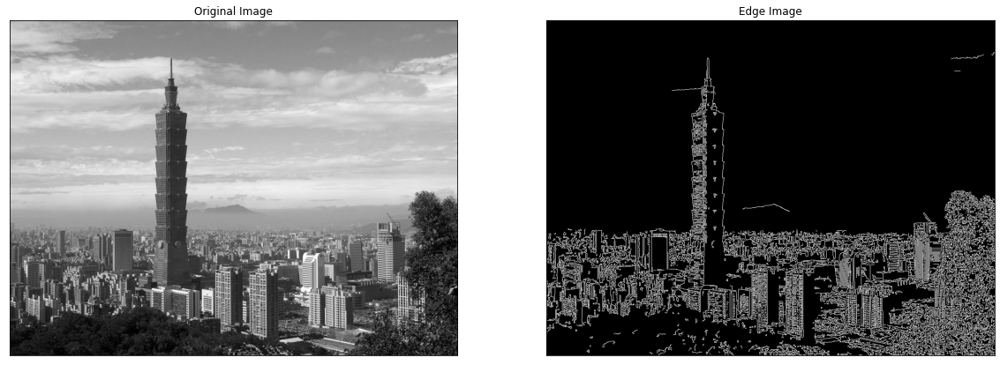

In [35]:
img = cv2.imread('./data/101.JPG',0)
edges = cv2.Canny(img,100,200)
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()